<a href="https://colab.research.google.com/github/mottasilvia/TESIS/blob/main/I3D_Fine_Tunning_UNI_PyTorchVideo_i3d_r50_primer_fine_tuning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#!pip install fvcore

In [ ]:
!pip install pytorchvideo

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 132.7/132.7 kB 1.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 1.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 2.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 33.0/33.0 MB 34.2 MB/s eta 0:00:00
  Created wheel for pytorchvideo: filename=pytorchvideo-0.1.5-py3-none-any.whl size=188686 sha256=1770fc4a75b31e2d484bb71a6f2f7e64020da35b0534062dfad017b84166f47a
  Stored in directory: /root/.cache/pip/wheels/ff/4e/81/0f72a543be9ed7eb737c95bfc5da4025e73226b44368074ece
  Created wheel for fvcore: filename=fvcore-0.1.5.post20221221-py3-none-any.whl size=61395 sha256=91b0f2771bf44985233c0d571aeb4950b2dcaf97901c5aa3febbd2aecc5dd28e
  Stored in directory: /root/.cache/pip/wheels/01/c0/af/77c1cf53a1be9e42a52b48e5af2169d40ec2e89f7362489dd0
  Created wheel 

In [ ]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision.transforms import Compose, Resize, CenterCrop, ToTensor, Normalize
import cv2
import numpy as np
from tqdm import tqdm

from torchvision import transforms
from PIL import Image


In [ ]:
class VideoDataset(Dataset):
    def __init__(self, video_dir, transform=None, frames_per_clip=32):
        self.video_dir = video_dir
        self.transform = transform
        self.frames_per_clip = frames_per_clip
        self.video_files = []
        self.labels = []
        self.classes = sorted(os.listdir(video_dir))

        for label_idx, label in enumerate(self.classes):
            video_folder = os.path.join(video_dir, label)
            for video_file in os.listdir(video_folder):
                if video_file.endswith(".avi"):
                    self.video_files.append(os.path.join(video_folder, video_file))
                    self.labels.append(label_idx)

    def __len__(self):
        return len(self.video_files)

    def __getitem__(self, idx):
        video_path = self.video_files[idx]
        label = self.labels[idx]

        # Leer el video
        cap = cv2.VideoCapture(video_path)
        frames = []
        while True:
            ret, frame = cap.read()
            if not ret:
                break
            frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
            frame = Image.fromarray(frame)  # Convertir de numpy.ndarray a PIL.Image
            frames.append(frame)

        cap.release()

        # Si hay más frames de los necesarios, seleccionamos aleatoriamente un segmento
        if len(frames) > self.frames_per_clip:
            start = np.random.randint(0, len(frames) - self.frames_per_clip)
            frames = frames[start:start + self.frames_per_clip]
        else:
            frames = np.pad(frames, ((0, max(0, self.frames_per_clip - len(frames))), (0, 0), (0, 0)), mode="constant")


        # Aplicar las transformaciones
        if self.transform:
            frames = [self.transform(frame) for frame in frames]

        # Convertir a tensor de PyTorch
        frames = torch.stack(frames)
        frames = frames.permute(1, 0, 2, 3)  # Reordenar a (C, T, H, W)

        return frames, label

In [ ]:
# Transformaciones
transform = Compose([
    Resize((224, 224)),
    ToTensor(),
    Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Dataset y DataLoader
train_dataset = VideoDataset(video_dir="/content/drive/MyDrive/UCU-TesisFinal/VIDEOS/Escenas/UNI/actions/train", transform=transform)
train_loader = DataLoader(train_dataset, batch_size=2, shuffle=True, num_workers=4)

val_dataset = VideoDataset(video_dir="/content/drive/MyDrive/UCU-TesisFinal/VIDEOS/Escenas/UNI/actions/val", transform=transform)
val_loader = DataLoader(val_dataset, batch_size=2, shuffle=False, num_workers=4)

In [ ]:
# Configuraciones básicas
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
num_classes = 2


In [ ]:
import torch
from pytorchvideo.models.hub import i3d_r50

# Cargar el modelo I3D preentrenado
model = i3d_r50(pretrained=True)

"""
I3D R50 model architecture from [1] with pretrained weights based on 8x8 setting
on the Kinetics dataset. Model with pretrained weights has top1 accuracy of 73.27.

[1] "Quo Vadis, Action Recognition? A New Model and the Kinetics Dataset"
    Joao Carreira, Andrew Zisserman
    https://arxiv.org/abs/1705.07750

Args:
    pretrained (bool): If True, returns a model pre-trained on the Kinetics dataset
    progress (bool): If True, displays a progress bar of the download to stderr
    kwargs: use these to modify any of the other model settings. All the
        options are defined in pytorchvideo/models/resnet.py

NOTE: to use the pretrained model, do not modify the model configuration
via the kwargs. Only modify settings via kwargs to initialize a new model
without pretrained weights.
"""

# Ver la arquitectura del modelo
#print(model)

Net(
  (blocks): ModuleList(
    (0): ResNetBasicStem(
      (conv): Conv3d(3, 64, kernel_size=(5, 7, 7), stride=(1, 2, 2), padding=(2, 3, 3), bias=False)
      (norm): BatchNorm3d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (activation): ReLU()
      (pool): MaxPool3d(kernel_size=(1, 3, 3), stride=(1, 2, 2), padding=[0, 1, 1], dilation=1, ceil_mode=False)
    )
    (1): ResStage(
      (res_blocks): ModuleList(
        (0): ResBlock(
          (branch1_conv): Conv3d(64, 256, kernel_size=(1, 1, 1), stride=(1, 1, 1), bias=False)
          (branch1_norm): BatchNorm3d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (branch2): BottleneckBlock(
            (conv_a): Conv3d(64, 64, kernel_size=(3, 1, 1), stride=(1, 1, 1), padding=(1, 0, 0), bias=False)
            (norm_a): BatchNorm3d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (act_a): ReLU()
            (conv_b): Conv3d(64, 64, kernel_size=(1,

In [ ]:
# Inspeccionar el último bloque para identificar la capa final
print(model.blocks[-1])

ResNetBasicHead(
  (pool): AvgPool3d(kernel_size=(4, 7, 7), stride=(1, 1, 1), padding=(0, 0, 0))
  (dropout): Dropout(p=0.5, inplace=False)
  (proj): Linear(in_features=2048, out_features=400, bias=True)
  (output_pool): AdaptiveAvgPool3d(output_size=1)
)


In [ ]:
# congelar el modelo
for param in model.parameters():
    param.requires_grad = False

# descongelar la última capa ## probar si conviene descongelar más de las últimas
for param in model.blocks[-1].parameters():
    param.requires_grad = True

In [ ]:
# modifica la última capa para ajustar a la cantidad de clases a predecir

# Si la última capa es una 'head' o 'classifier'
if hasattr(model.blocks[-1], 'proj'):
    model.blocks[-1].proj = nn.Linear(model.blocks[-1].proj.in_features, num_classes)
elif hasattr(model.blocks[-1], 'classifier'):
    model.blocks[-1].classifier = nn.Linear(model.blocks[-1].classifier.in_features, num_classes)
else:
    # Caso general si no es ninguno de los anteriores
    model.blocks[-1] = nn.Linear(model.blocks[-1].out_features, num_classes)


In [ ]:
# Definir pérdida y optimizador
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-4)

# Entrenamiento
num_epochs = 4

for epoch in range(num_epochs):
    model.train()
    running_loss = 0.1 # estaba en 0.0

    for inputs, labels in tqdm(train_loader):
        inputs, labels = inputs.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    print(f"Epoch {epoch+1}/{num_epochs}, Loss: {running_loss/len(train_loader)}")

    # Validación después de cada época
    model.eval()
    val_loss = 0.0
    correct = 0

    with torch.no_grad():
        for inputs, labels in val_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            val_loss += loss.item()

            _, preds = torch.max(outputs, 1)
            correct += torch.sum(preds == labels.data)

    val_loss /= len(val_loader)
    val_acc = correct.double() / len(val_loader.dataset)

    print(f"Validation Loss: {val_loss}, Validation Accuracy: {val_acc}")


100%|██████████| 10/10 [00:14<00:00,  1.48s/it]

Epoch 1/4, Loss: 0.721955052614212


Validation Loss: 0.6641361564397812, Validation Accuracy: 0.75


100%|██████████| 10/10 [00:14<00:00,  1.47s/it]

Epoch 2/4, Loss: 0.7303359365463257


Validation Loss: 0.6607967913150787, Validation Accuracy: 0.75


100%|██████████| 10/10 [00:14<00:00,  1.47s/it]

Epoch 3/4, Loss: 0.7106335556507111


Validation Loss: 0.6550469696521759, Validation Accuracy: 1.0


100%|██████████| 10/10 [00:14<00:00,  1.49s/it]

Epoch 4/4, Loss: 0.698134741783142


Validation Loss: 0.6194892227649689, Validation Accuracy: 0.875


In [ ]:
# Definir el dataset de prueba usando la clase VideoDataset
test_dataset = VideoDataset(video_dir="/content/drive/MyDrive/UCU-TesisFinal/VIDEOS/Escenas/UNI/actions/test", transform=transform)
test_loader = DataLoader(test_dataset, batch_size=2, shuffle=False, num_workers=4)

# Evaluación en el conjunto de prueba
model.eval()  # Establecer el modelo en modo evaluación
test_loss = 0.0
correct = 0

with torch.no_grad():  # Desactivar el cálculo del gradiente para la evaluación
    for inputs, labels in tqdm(test_loader):
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        test_loss += loss.item()

        _, preds = torch.max(outputs, 1)
        correct += torch.sum(preds == labels.data)

# Calcular las métricas finales
test_loss /= len(test_loader)
test_acc = correct.double() / len(test_loader.dataset)

print(f"Test Loss: {test_loss:.4f}, Test Accuracy: {test_acc:.4f}")


100%|██████████| 10/10 [00:14<00:00,  1.42s/it]

Test Loss: 0.6299, Test Accuracy: 0.9000


  0%|          | 0/10 [00:00<?, ?it/s]

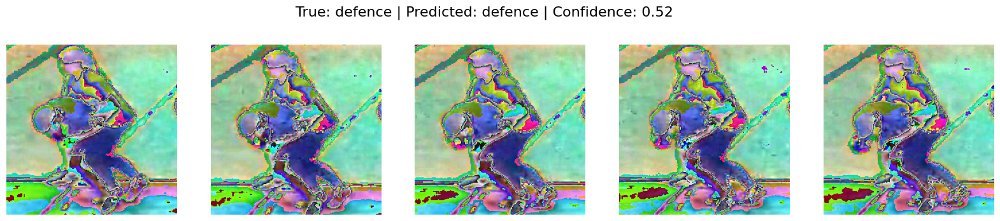

 10%|█         | 1/10 [00:03<00:31,  3.47s/it]

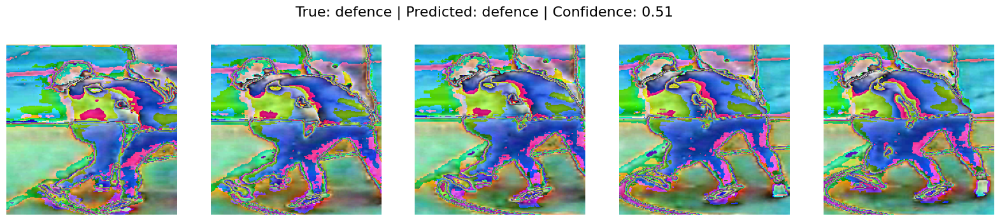

 20%|██        | 2/10 [00:05<00:19,  2.41s/it]

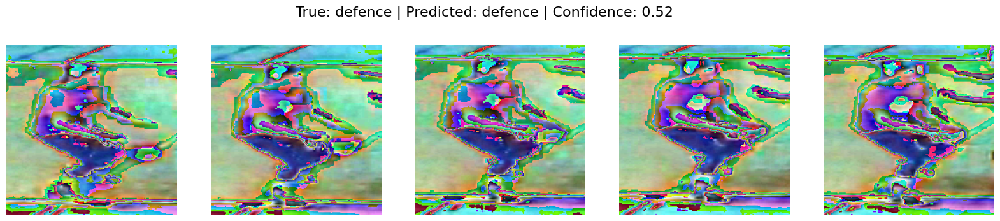

 30%|███       | 3/10 [00:06<00:14,  2.07s/it]

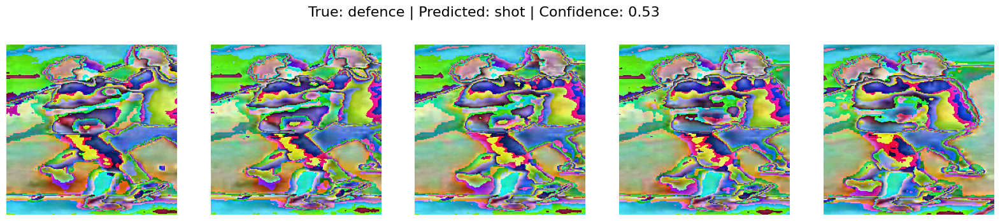

 40%|████      | 4/10 [00:08<00:11,  1.91s/it]

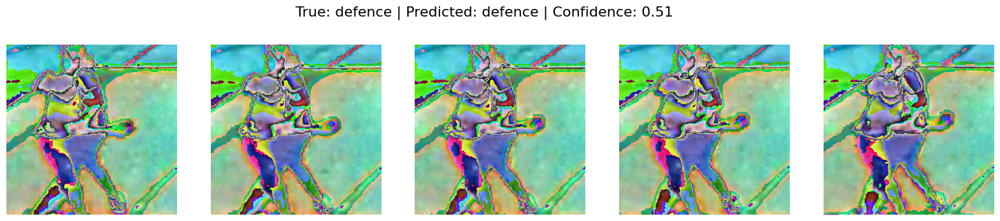

 50%|█████     | 5/10 [00:10<00:09,  1.84s/it]

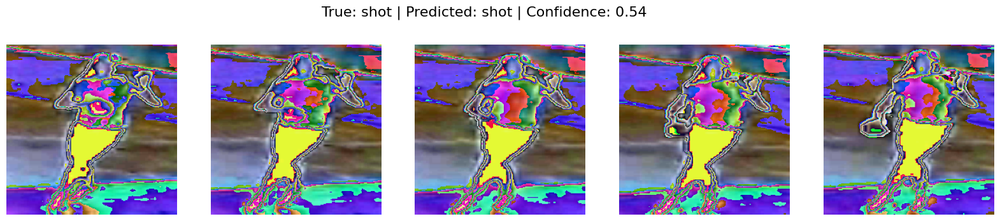

 60%|██████    | 6/10 [00:11<00:07,  1.76s/it]

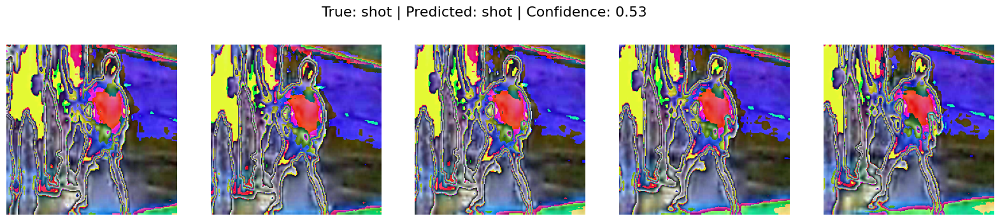

 70%|███████   | 7/10 [00:13<00:05,  1.72s/it]

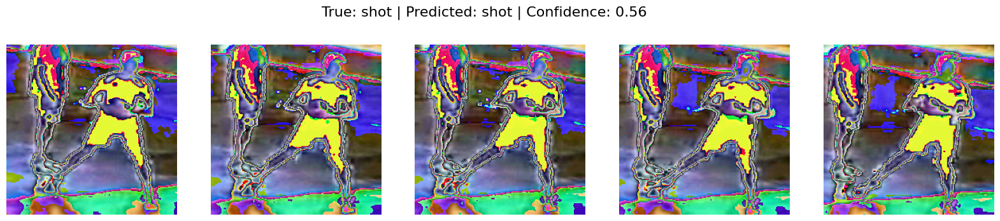

 80%|████████  | 8/10 [00:15<00:03,  1.79s/it]

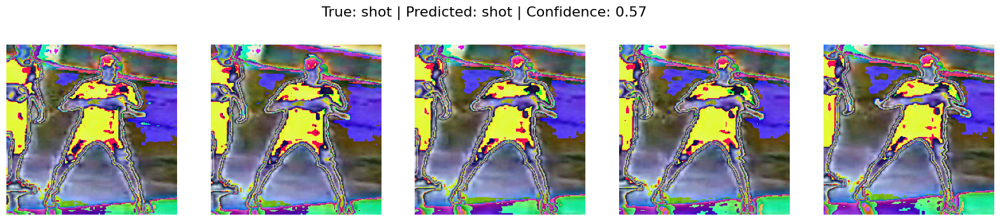

 90%|█████████ | 9/10 [00:17<00:01,  1.77s/it]

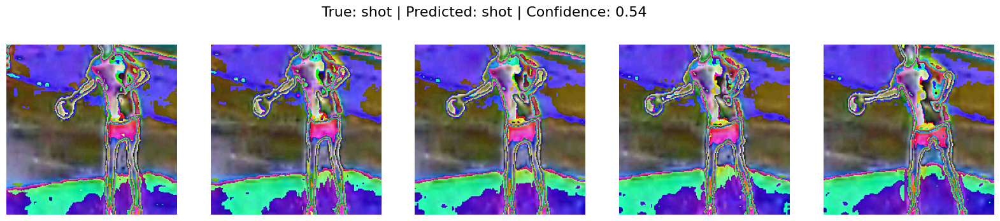

100%|██████████| 10/10 [00:18<00:00,  1.89s/it]

Test Loss: 0.6387, Test Accuracy: 0.8500


In [ ]:
import matplotlib.pyplot as plt
import torchvision.transforms as T

# Función para mostrar los frames junto con las predicciones
def visualize_predictions(inputs, labels, preds, confidences, class_names):
    # Convertir frames de tensor a imagen PIL
    to_pil = T.ToPILImage()

    # Seleccionar un video al azar de los predichos
    idx = np.random.randint(0, inputs.size(0))

    # Obtener frames del video seleccionado
    frames = inputs[idx].permute(1, 0, 2, 3).cpu()  # (T, C, H, W)
    true_label = class_names[labels[idx].item()]
    predicted_label = class_names[preds[idx].item()]
    confidence = confidences[idx].item()

    # Mostrar algunos frames
    fig, axes = plt.subplots(1, 5, figsize=(20, 4))
    for i, ax in enumerate(axes):
        if i < frames.size(0):
            x = frames[i]
            ax.imshow(to_pil(x))

        ax.axis('off')

    # Mostrar información de predicción
    plt.suptitle(f"True: {true_label} | Predicted: {predicted_label} | Confidence: {confidence:.2f}", fontsize=16)
    plt.show()

# Evaluación en el conjunto de prueba con visualización
model.eval()  # Establecer el modelo en modo evaluación
test_loss = 0.0
correct = 0
class_names = test_dataset.classes  # Obtener nombres de clases

with torch.no_grad():  # Desactivar el cálculo del gradiente para la evaluación
    for inputs, labels in tqdm(test_loader):
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        test_loss += loss.item()

        # Obtener predicciones y confianza
        _, preds = torch.max(outputs, 1)
        confidences = torch.softmax(outputs, dim=1).max(dim=1)[0]

        correct += torch.sum(preds == labels.data)

        # Visualizar algunas predicciones
        visualize_predictions(inputs, labels, preds, confidences, class_names)

# Calcular las métricas finales
test_loss /= len(test_loader)
test_acc = correct.double() / len(test_loader.dataset)

print(f"Test Loss: {test_loss:.4f}, Test Accuracy: {test_acc:.4f}")

# las imágenes se ven mal porque se aplica normalize en las transformaciones del dataset


Miércoles 11/09/24
- Como no se pudo hacer el fine tunning con Tensor Flow retomamos el fine tunning con PyTorch del modelo i3d_r50.
- A tener en cuenta: en el video dataset hay que definir la cantidad de frames a utilizar porque si el video es más grande se toman solamente la cantidad y al azar. Se deberían prerparar los videos a cantidad de cuadros similares. Probar entre 48 y 64. A definir según frames por segundo de los videos y duración de las acciones.
- Sin congelar el modelo, se pudo ver que overfiteo. Valores de accuracy de 1.0 en validación y cercano a 1 en test con confidences mayores a 0.8 en test. Congelándo todas las capas menos la última, donde solamente se cambió la cantidad de clases, bajó accuracy en validación a 0.97 y a 0.9 en test donde la confidence bajó a valores entre 0.5 y 0.6. Todo esto con un número reducido de imágenes por acción y dos acciones.
- Como el video dataset aplica la transformación de normalización, las imágenes no se visualizan correctamente.
- Reproducir con todas las imágenes de UNI y luego recortar nuestras acciones.

- El paper de referencia utilizó I3D_40D model that uses decimation strategy and 40 input frames. Se podría probar con exactamente lo mismo o con otro, ejemplo i3d_r50 pero hay que justificar. lista de modelos https://pytorch.org/vision/stable/models.html
https://github.com/facebookresearch/pytorchvideo/blob/main/pytorchvideo/models/hub/resnet.py

- ver optical flow

# Predicción versión 1

> Añadir blockquote



In [ ]:
import torch
import cv2
import numpy as np
from torchvision.transforms import Compose, Resize, ToTensor, Normalize
from PIL import Image

# Configurar las transformaciones para los frames
transform = Compose([
    Resize((224, 224)),
    ToTensor(),
    Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Función para realizar la inferencia en un video
def predict_video(video_path, model, transform, frames_per_clip=16, device='cpu'):
    # Leer el video
    cap = cv2.VideoCapture(video_path)
    frames = []
    while True:
        ret, frame = cap.read()
        if not ret:
            break
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        frame = Image.fromarray(frame)  # Convertir a PIL.Image
        frame = transform(frame)  # Aplicar transformaciones
        frames.append(frame)

    cap.release()

    # Procesar el video para tener un clip de longitud fija
    if len(frames) >= frames_per_clip:
        frames = frames[:frames_per_clip]
    else:
        # Padding si el video tiene menos frames que frames_per_clip
        padding = [frames[-1]] * (frames_per_clip - len(frames))
        frames.extend(padding)

    # Convertir a tensor y reorganizar dimensiones
    frames = torch.stack(frames)
    frames = frames.unsqueeze(0)  # Añadir dimensión de batch
    frames = frames.permute(0, 2, 1, 3, 4)  # Reordenar a (B, C, T, H, W)

    # Mover a la GPU si es necesario
    frames = frames.to(device)
    model = model.to(device)

    # Realizar la inferencia
    model.eval()
    with torch.no_grad():
        outputs = model(frames)
        _, preds = torch.max(outputs, 1)
        confidence = torch.softmax(outputs, dim=1).max(dim=1)[0]

    return preds.item(), confidence.item()

# Ruta del nuevo video a evaluar
video_path = "/content/drive/MyDrive/UCU-TesisFinal/VIDEOS/Escenas/Tiro_al_arco/vlc-record-2024-03-17-16h42m39s-1ra Fecha - Torneo Interligas - 2024.mp4-.mp4"

# Realizar la predicción
predicted_class, confidence = predict_video(video_path, model, transform, device=device)

# Mostrar el resultado
class_names = test_dataset.classes  # Asumiendo que tienes el dataset de prueba cargado
print(f"Predicted Class: {class_names[predicted_class]}, Confidence: {confidence:.4f}")


Predicted Class: defence, Confidence: 0.5784


# Predicción Versión 2

In [ ]:
import torch
import cv2
import numpy as np
from torchvision.transforms import Compose, Resize, ToTensor, Normalize
from PIL import Image
import time

# Configurar las transformaciones para los frames
transform = Compose([
    Resize((224, 224)),
    ToTensor(),
    Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Función para realizar la inferencia en un video cada 2 segundos
def predict_video_interval(video_path, model, transform, frames_per_clip=16, interval_sec=2, device='cpu'):
    # Abrir el video
    cap = cv2.VideoCapture(video_path)

    # Obtener propiedades del video
    fps = cap.get(cv2.CAP_PROP_FPS)
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    duration = total_frames / fps
    print(f"Duration: {duration:.2f} seconds, FPS: {fps:.2f}")

    # Inicializar variables
    current_time = 0
    predictions = []

    while True:
        frames = []
        # Saltar frames hasta el siguiente intervalo de tiempo
        cap.set(cv2.CAP_PROP_POS_MSEC, current_time * 1000)

        # Leer frames para formar un clip
        for _ in range(frames_per_clip):
            ret, frame = cap.read()
            if not ret:
                break
            frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
            frame = Image.fromarray(frame)  # Convertir a PIL.Image
            frame = transform(frame)  # Aplicar transformaciones
            frames.append(frame)

        if len(frames) < frames_per_clip:
            break  # Salir si no hay suficientes frames para formar un clip

        # Convertir a tensor y reorganizar dimensiones
        frames = torch.stack(frames)
        frames = frames.unsqueeze(0)  # Añadir dimensión de batch
        frames = frames.permute(0, 2, 1, 3, 4)  # Reordenar a (B, C, T, H, W)

        # Mover a la GPU si es necesario
        frames = frames.to(device)
        model = model.to(device)

        # Realizar la inferencia
        model.eval()
        with torch.no_grad():
            outputs = model(frames)
            probabilities = torch.softmax(outputs, dim=1)
            sorted_probs, sorted_indices = torch.sort(probabilities, dim=1, descending=True)

        # Guardar las predicciones y los valores
        predictions.append((current_time, sorted_probs.squeeze(), sorted_indices.squeeze()))

        # Avanzar al siguiente intervalo de tiempo
        current_time += interval_sec

    cap.release()
    return predictions

# Ruta del nuevo video a evaluar
video_path = "/content/drive/MyDrive/UCU-TesisFinal/VIDEOS/Escenas/Tiro_al_arco/vlc-record-2024-03-17-16h42m39s-1ra Fecha - Torneo Interligas - 2024.mp4-.mp4"

# Realizar la predicción en intervalos
predictions = predict_video_interval(video_path, model, transform, device=device)

# Mostrar resultados
class_names = test_dataset.classes  # Asumiendo que tienes el dataset de prueba cargado
for time_sec, probs, indices in predictions:
    print(f"\nTime: {time_sec:.2f} seconds")
    for i in range(len(indices)):
        print(f"Class: {class_names[indices[i].item()]} - Confidence: {probs[i].item():.4f}")


Duration: 8.50 seconds, FPS: 29.88

Time: 0.00 seconds
Class: defence - Confidence: 0.5784
Class: shot - Confidence: 0.4216

Time: 2.00 seconds
Class: shot - Confidence: 0.5156
Class: defence - Confidence: 0.4844

Time: 4.00 seconds
Class: defence - Confidence: 0.5480
Class: shot - Confidence: 0.4520

Time: 6.00 seconds
Class: defence - Confidence: 0.6045
Class: shot - Confidence: 0.3955


# Predicción Versión 3

Duration: 1.36 seconds, FPS: 47.95

Time: 0.00 seconds
Class: defence - Confidence: 0.5339
Class: shot - Confidence: 0.4661


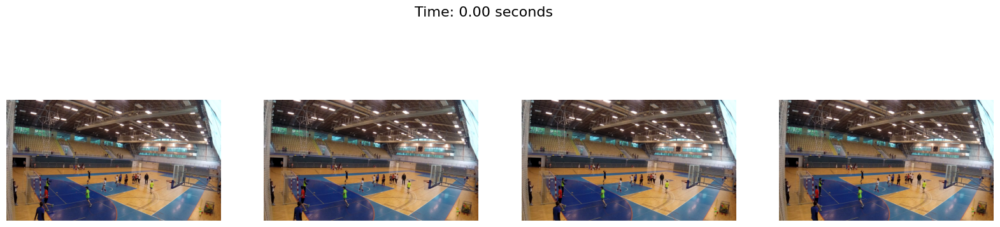

In [ ]:
import torch
import cv2
import numpy as np
from torchvision.transforms import Compose, Resize, ToTensor, Normalize
from PIL import Image
import matplotlib.pyplot as plt

# Configurar las transformaciones para los frames
transform = Compose([
    Resize((224, 224)),
    ToTensor(),
    Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Función para realizar la inferencia en un video cada 2 segundos y mostrar ejemplos
def predict_video_interval(video_path, model, transform, frames_per_clip=16, interval_sec=2, device='cpu'):
    # Abrir el video
    cap = cv2.VideoCapture(video_path)

    # Obtener propiedades del video
    fps = cap.get(cv2.CAP_PROP_FPS)
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    duration = total_frames / fps
    print(f"Duration: {duration:.2f} seconds, FPS: {fps:.2f}")

    # Inicializar variables
    current_time = 0
    predictions = []

    while True:
        frames = []
        # Saltar frames hasta el siguiente intervalo de tiempo
        cap.set(cv2.CAP_PROP_POS_MSEC, current_time * 1000)

        # Leer frames para formar un clip
        for _ in range(frames_per_clip):
            ret, frame = cap.read()
            if not ret:
                break
            frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
            frame_pil = Image.fromarray(frame_rgb)  # Convertir a PIL.Image
            frame_tensor = transform(frame_pil)  # Aplicar transformaciones
            frames.append((frame_tensor, frame_rgb))

        if len(frames) < frames_per_clip:
            break  # Salir si no hay suficientes frames para formar un clip

        # Separar frames en tensores y en imágenes RGB
        frames_tensor = torch.stack([f[0] for f in frames])
        frames_rgb = [f[1] for f in frames]

        # Reorganizar dimensiones del tensor
        frames_tensor = frames_tensor.unsqueeze(0)  # Añadir dimensión de batch
        frames_tensor = frames_tensor.permute(0, 2, 1, 3, 4)  # Reordenar a (B, C, T, H, W)

        # Mover a la GPU si es necesario
        frames_tensor = frames_tensor.to(device)
        model = model.to(device)

        # Realizar la inferencia
        model.eval()
        with torch.no_grad():
            outputs = model(frames_tensor)
            probabilities = torch.softmax(outputs, dim=1)
            sorted_probs, sorted_indices = torch.sort(probabilities, dim=1, descending=True)

        # Guardar las predicciones y los valores
        predictions.append((current_time, sorted_probs.squeeze(), sorted_indices.squeeze(), frames_rgb))

        # Avanzar al siguiente intervalo de tiempo
        current_time += interval_sec

    cap.release()
    return predictions

# Ruta del nuevo video a evaluar
#video_path = "/content/drive/MyDrive/UCU-TesisFinal/VIDEOS/Escenas/Tiro_al_arco/vlc-record-2024-03-17-16h42m39s-1ra Fecha - Torneo Interligas - 2024.mp4-.mp4"
video_path = "/content/drive/MyDrive/UCU-TesisFinal/VIDEOS/Escenas/UNI/scenes/shot/shot_KS_10.mp4"

# Realizar la predicción en intervalos
predictions = predict_video_interval(video_path, model, transform, device=device)

# Mostrar resultados
class_names = test_dataset.classes  # Asumiendo que tienes el dataset de prueba cargado
for time_sec, probs, indices, frames_rgb in predictions:
    print(f"\nTime: {time_sec:.2f} seconds")
    for i in range(len(indices)):
        print(f"Class: {class_names[indices[i].item()]} - Confidence: {probs[i].item():.4f}")

    # Mostrar 4 frames de ejemplo
    fig, axes = plt.subplots(1, 4, figsize=(20, 5))
    for i, ax in enumerate(axes):
        if i < len(frames_rgb):
            ax.imshow(frames_rgb[i])
        ax.axis('off')
    plt.suptitle(f"Time: {time_sec:.2f} seconds", fontsize=16)
    plt.show()


Duration: 8.50 seconds, FPS: 29.88

Time: 0.00 seconds
Class: defence - Confidence: 0.5784
Class: shot - Confidence: 0.4216


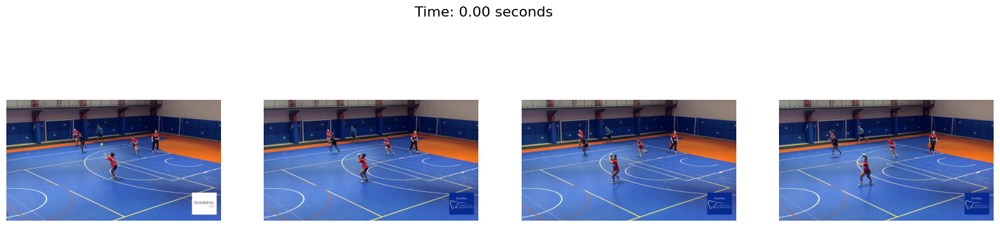


Time: 2.00 seconds
Class: shot - Confidence: 0.5156
Class: defence - Confidence: 0.4844


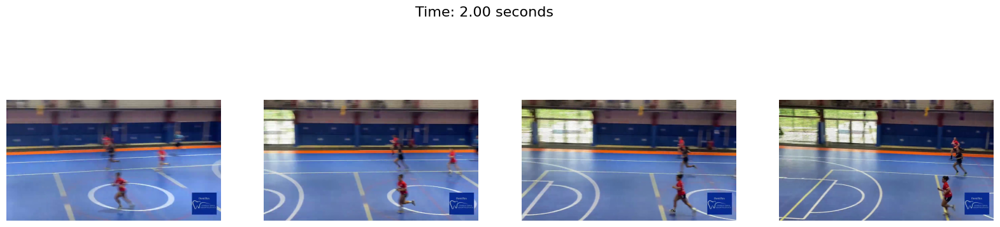


Time: 4.00 seconds
Class: defence - Confidence: 0.5480
Class: shot - Confidence: 0.4520


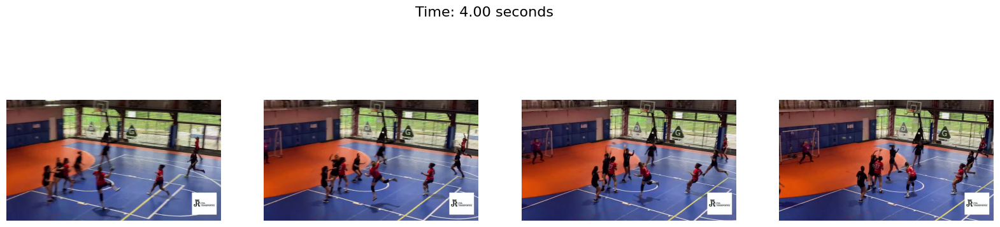


Time: 6.00 seconds
Class: defence - Confidence: 0.6045
Class: shot - Confidence: 0.3955


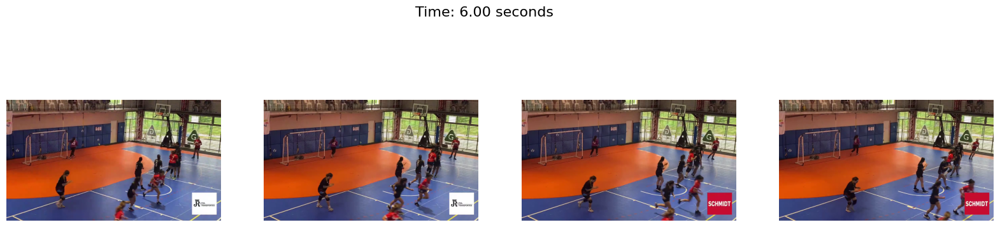

In [ ]:
import torch
import cv2
import numpy as np
from torchvision.transforms import Compose, Resize, ToTensor, Normalize
from PIL import Image
import matplotlib.pyplot as plt

# Configurar las transformaciones para los frames
transform = Compose([
    Resize((224, 224)),
    ToTensor(),
    Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Función para realizar la inferencia en un video cada 2 segundos y mostrar ejemplos distribuidos uniformemente
def predict_video_interval(video_path, model, transform, frames_per_clip=16, interval_sec=2, device='cpu'):
    # Abrir el video
    cap = cv2.VideoCapture(video_path)

    # Obtener propiedades del video
    fps = cap.get(cv2.CAP_PROP_FPS)
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    duration = total_frames / fps
    print(f"Duration: {duration:.2f} seconds, FPS: {fps:.2f}")

    # Inicializar variables
    current_time = 0
    predictions = []

    while True:
        frames = []
        # Saltar frames hasta el siguiente intervalo de tiempo
        cap.set(cv2.CAP_PROP_POS_MSEC, current_time * 1000)

        # Leer frames para formar un clip
        for _ in range(frames_per_clip):
            ret, frame = cap.read()
            if not ret:
                break
            frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
            frame_pil = Image.fromarray(frame_rgb)  # Convertir a PIL.Image
            frame_tensor = transform(frame_pil)  # Aplicar transformaciones
            frames.append((frame_tensor, frame_rgb))

        if len(frames) < frames_per_clip:
            break  # Salir si no hay suficientes frames para formar un clip

        # Separar frames en tensores y en imágenes RGB
        frames_tensor = torch.stack([f[0] for f in frames])
        frames_rgb = [f[1] for f in frames]

        # Reorganizar dimensiones del tensor
        frames_tensor = frames_tensor.unsqueeze(0)  # Añadir dimensión de batch
        frames_tensor = frames_tensor.permute(0, 2, 1, 3, 4)  # Reordenar a (B, C, T, H, W)

        # Mover a la GPU si es necesario
        frames_tensor = frames_tensor.to(device)
        model = model.to(device)

        # Realizar la inferencia
        model.eval()
        with torch.no_grad():
            outputs = model(frames_tensor)
            probabilities = torch.softmax(outputs, dim=1)
            sorted_probs, sorted_indices = torch.sort(probabilities, dim=1, descending=True)

        # Guardar las predicciones y los valores
        predictions.append((current_time, sorted_probs.squeeze(), sorted_indices.squeeze(), frames_rgb))

        # Avanzar al siguiente intervalo de tiempo
        current_time += interval_sec

    cap.release()
    return predictions

# Función para mostrar 4 imágenes distribuidas uniformemente a lo largo del video
def display_images_uniformly(frames_rgb, time_sec):
    num_images = 4  # Número de imágenes a mostrar
    total_frames = len(frames_rgb)
    indices = np.linspace(0, total_frames - 1, num_images).astype(int)  # Seleccionar índices uniformemente distribuidos

    fig, axes = plt.subplots(1, num_images, figsize=(20, 5))
    for i, ax in enumerate(axes):
        ax.imshow(frames_rgb[indices[i]])
        ax.axis('off')
    plt.suptitle(f"Time: {time_sec:.2f} seconds", fontsize=16)
    plt.show()

# Ruta del nuevo video a evaluar
video_path = "/content/drive/MyDrive/UCU-TesisFinal/VIDEOS/Escenas/Tiro_al_arco/vlc-record-2024-03-17-16h42m39s-1ra Fecha - Torneo Interligas - 2024.mp4-.mp4"
#video_path = "/content/drive/MyDrive/UCU-TesisFinal/VIDEOS/Escenas/UNI/scenes/shot/shot_KS_10.mp4"

# Realizar la predicción en intervalos
predictions = predict_video_interval(video_path, model, transform, device=device)

# Mostrar resultados
class_names = test_dataset.classes  # Asumiendo que tienes el dataset de prueba cargado
for time_sec, probs, indices, frames_rgb in predictions:
    print(f"\nTime: {time_sec:.2f} seconds")
    for i in range(len(indices)):
        print(f"Class: {class_names[indices[i].item()]} - Confidence: {probs[i].item():.4f}")

    # Mostrar imágenes distribuidas uniformemente
    display_images_uniformly(frames_rgb, time_sec)


In [ ]:
print(model.class())

SyntaxError: invalid syntax (<ipython-input-31-548859e2085f>, line 1)